# Project 2 - Introduction to Image & Video Processing
##### Diogo Rio, i6265026 - Spring 2022

### Task 1 - Image Degradation w/ Motion Blur and Additive Noise
#### (1.1) Blur and Noise Application
##### 1. Motion Blur Function Creation + Application (Frequency Domain)

In [131]:
# Import required libraries and packages
from matplotlib import pyplot as plt
import numpy as np
import cv2

# NOTE: In some instances, I'll be using numpy to allow for better readability in simple computations.
# I assumed functions such as np.add(), np.multiply(), np.exp(), etc. don't count as non-allowed inbuilt functions.

# Function: Hide the output label(s)
def hide_labels(axis):
    for i in range(len(axis)):
        axis[i].plot()

# Function: Perform the desired plot build (2 images side to side)
def build_plot(img1, str1, img2, str2, gray):
    
    # Plot and set titles, avoiding warning by using casting to np.uint8
    fig, ax = plt.subplots(1, 2, figsize=(12,12))
    if gray:
        ax[0].imshow(img1, cmap = 'gray')
    else:
        ax[0].imshow(img1)
    ax[0].set_title(str1)
    if gray:
        ax[1].imshow(img2, cmap = 'gray')
    else:
        ax[1].imshow(img2)
    ax[1].set_title(str2)
    hide_labels(ax)
    
# Function: Motion Blur Filtering, H(u,v)
def motion_blur(img, a, b):
    new_img = img.copy()
    
    # In order to keep image dimensions: 
    # Get row (x) and column (y) information from inputted image, f(x,y) 
    # since it will be the one transformed (and outputed)
    x = new_img.shape[0]
    y = new_img.shape[1]
    
    # Compute the two terms of H, as seen in Lab5
    # Using np.mgrid to fit dimensions to assign during the IFT process
    [u, v] = np.mgrid[-x/2:x/2, -y/2:y/2]
    u, v = 2*u/x, 2*v/y
    
    sinc_input = np.add(np.multiply(a, u), np.multiply(b, v)) 
    exp_input = np.multiply(-1j*np.pi, sinc_input)
    
    # Compute H(u,v)
    h = np.multiply(np.sinc(sinc_input), np.exp(exp_input))
        
    # Deconstruct the image so we can perform blur computations
    # Perform a 2D (D)FT, F(u,v)  
    ft_2d = np.fft.fft2(new_img)
    
    # Invert the FT performed, so we can obtain the image back, after applying filter h
    ift_2d = ft_2d.copy()
    # Build color channels
    ift_2d[:,:,0] = np.multiply(ft_2d[:,:,0], h) 
    ift_2d[:,:,1] = np.multiply(ft_2d[:,:,1], h) 
    ift_2d[:,:,2] = np.multiply(ft_2d[:,:,2], h) 
    
    new_img = np.fft.ifft2(ift_2d)
    
    return new_img

# Load image and transform it into its RGB format, so it can be used by the plotting functions
bird_img = cv2.imread('sample_imgs/bird.jpg')
bird_img = cv2.cvtColor(bird_img, cv2.COLOR_BGR2RGB)

# Apply motion blur
blur_img = motion_blur(bird_img, 0, 0.175)

##### 2. Additive Gaussian Noise Application on Motion Blurred Image (Fourier Domain)
(Noise should be noticeable, but not completely degrading of the image)

In [132]:
from skimage.util import random_noise

# Function: Additive Gaussian Noise, N(u,v)
def add_noise(img):
    new_img = img.copy()
    
    # From inbuilt function presented in Lab5:
    # In this case, it's simple, since rand_ns already adds over the provided image, forming G(u,v)
    new_img = random_noise(np.abs(new_img).astype(np.uint8), "gaussian", mean = 0, var = 0.25)
    
    return new_img

# Build final noisy image, G(u,v) = F(u,v) * H(u,v) + N(u,v)
# Apply noise addition to already blurred image
ns_blur_img = add_noise(blur_img)

##### 3. Display (1) and (2)

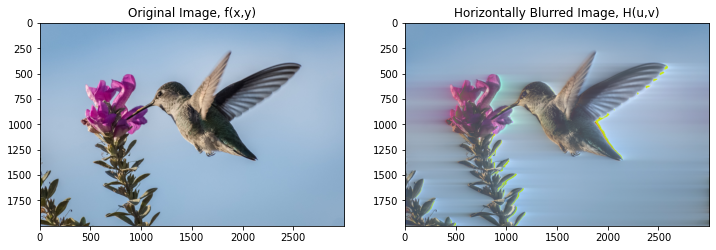

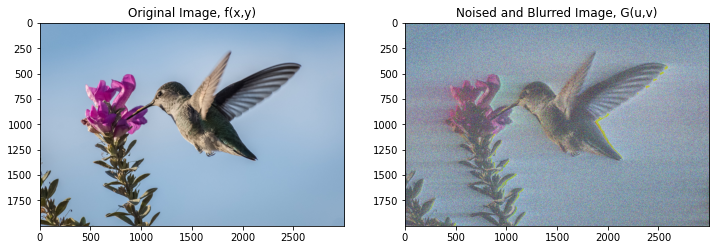

In [133]:
# Display results 
build_plot(bird_img, "Original Image, f(x,y)", np.abs(blur_img).astype(np.uint8), "Horizontally Blurred Image, H(u,v)", False)
build_plot(bird_img, "Original Image, f(x,y)", ns_blur_img, "Noised and Blurred Image, G(u,v)", False)

#### (1.2) Noise Removal
##### 1. Direct Inverse Filtering on Motion Blurred Image
(Display and explain results)

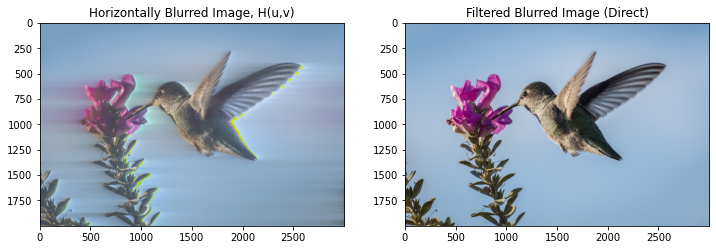

In [134]:
# Function: Direct Inverse Filtering of the Motion Blur
def blur_inv_filter(img, a, b):
    new_img = img.copy()
    
    # Same process altogether as explained before, yet divide to filter out, instead of multiplying by h
    x = new_img.shape[0]
    y = new_img.shape[1]

    [u, v] = np.mgrid[-x/2:x/2, -y/2:y/2]
    u, v = 2*u/x, 2*v/y
    
    sinc_input = np.add(np.multiply(a, u), np.multiply(b, v)) 
    exp_input = np.multiply(-1j*np.pi, sinc_input)

    h = np.multiply(np.sinc(sinc_input), np.exp(exp_input))
        
    ft_2d = np.fft.fft2(new_img)
    
    # Filtering out the known blur
    ift_2d = ft_2d.copy()
    ift_2d[:,:,0] = np.divide(ft_2d[:,:,0], h) 
    ift_2d[:,:,1] = np.divide(ft_2d[:,:,1], h) 
    ift_2d[:,:,2] = np.divide(ft_2d[:,:,2], h)
    
    new_img = np.fft.ifft2(ift_2d)
    
    return new_img

# Apply direct inverse filter to the motion blurred image
filt_blur_img = blur_inv_filter(blur_img, 0, 0.175)

# Display results 
build_plot(np.abs(blur_img).astype(np.uint8), "Horizontally Blurred Image, H(u,v)", 
           np.abs(filt_blur_img).astype(np.uint8), "Filtered Blurred Image (Direct)", False)

As we can see, the **direct inverse filtering** process is quite self-explanatory, as we can perform the computation of the blur we added to the image previously, all over again, and apply it to the blurred version of it. 

By applying it, it's understood that, since our goal is to filter out the blur, what is happening is that dividing each channel by H will result in the image we initially passed to get blurred on.

##### 2. Direct Inverse Filtering on Motion Blurred and Added Noise Image
(Display and explain results)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


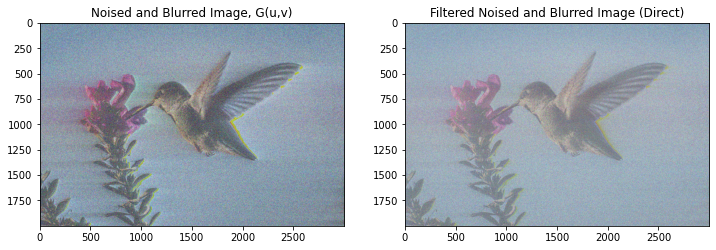

In [135]:
# Apply direct inverse filter to the motion blurred image
filt_ns_blur_img = blur_inv_filter(ns_blur_img, 0, 0.175)

# Display results 
build_plot(ns_blur_img, "Noised and Blurred Image, G(u,v)", 
           np.abs(filt_ns_blur_img), "Filtered Noised and Blurred Image (Direct)", False)

The same that was explained in the previous point applies here. The random noise is not being removed, since that noise cannot be known, thus it wouldn't be a direct inverse filter if we tried to remove that too. Thus, I understood it was to leave it in this demonstration.

The Gaussian noise seems to affect the blur noise removal of H, though it is possible to have been due to the constant conversions in number types. In any case, the effect of the filter is noticeable.

##### 3. MMSE Filter Equation on Added Noise Creation + Application on Added Noise Image

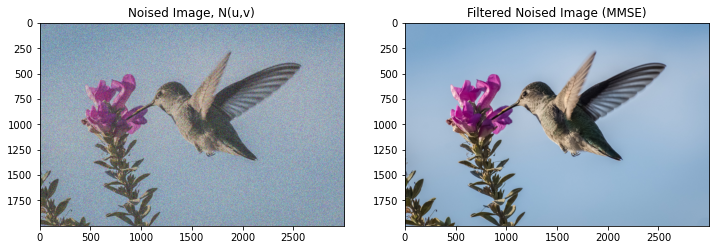

In [136]:
# Function: MMSE Filtering
def mmse_filter(img1, img2):
    og_img = img1.copy()
    ns_img = img2.copy()
    
    # Assess the untouched image and the noise power
    og_ft_2d = np.fft.fft2(og_img)
    og_pwr = np.power(np.abs(og_ft_2d), 2)
    
    ns_ft_2d = np.fft.fft2(ns_img)
    ns_pwr = np.power(np.abs(ns_ft_2d), 2)

    ft_2d = np.fft.fft2(np.subtract(og_img, ns_img))
    
    # Form the filtered image
    ift_2d = ft_2d.copy()
    # Build color channels
    ift_2d[:,:,0] = np.divide(ft_2d[:,:,0], np.add(1, (np.divide(ns_pwr, og_pwr)))[:,:,0])
    ift_2d[:,:,1] = np.divide(ft_2d[:,:,1], np.add(1, (np.divide(ns_pwr, og_pwr)))[:,:,1])
    ift_2d[:,:,2] = np.divide(ft_2d[:,:,2], np.add(1, (np.divide(ns_pwr, og_pwr)))[:,:,2]) 
    
    new_img = np.fft.ifft2(ift_2d)
    
    return new_img

# Only add noise to original image
ns_img = add_noise(bird_img)

# Apply MMSE Filter on added noise image np.abs(filt_ns_img).astype(np.uint8)
filt_ns_img = mmse_filter(bird_img, ns_img)

# Display results
build_plot(ns_img, "Noised Image, N(u,v)", np.abs(filt_ns_img).astype(np.uint8), "Filtered Noised Image (MMSE)", False)

##### 4. MMSE Filter Equation on Motion Blur and Added Noise Creation + Noise Power Spectrum Ratio to OG Image Power Spectrum Approximation (using K) + K Computation (AVG of True Ratio) + Application on Motion Blurred and Added Noise Image

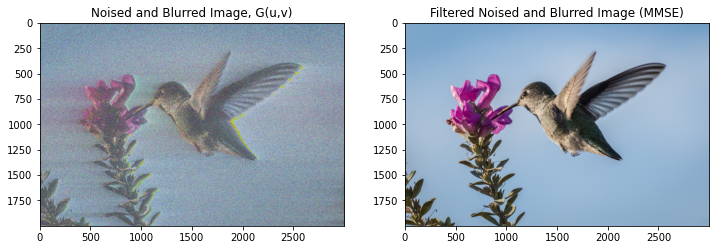

In [137]:
# Function: MMSE Filtering using the K Constant
def mmse_blur_filter(img1, img2):
    
    # Same process, yet with the k constant taken into account
    og_img = img1.copy()
    ns_img = img2.copy()

    og_ft_2d = np.fft.fft2(og_img)
    og_pwr = np.power(np.abs(og_ft_2d), 2)
    
    ns_ft_2d = np.fft.fft2(ns_img)
    ns_pwr = np.power(np.abs(ns_ft_2d), 2)

    ft_2d = np.fft.fft2(np.subtract(og_img, ns_img))
    
    # Establish k value, which assumes the ratio of the power spectrums
    k = np.divide(np.sum(ns_pwr), np.sum(og_pwr))
    
    # Form the filtered image
    ift_2d = ft_2d.copy()
    # Build color channels
    ift_2d[:,:,0] = np.divide(ft_2d[:,:,0], np.add(1, np.multiply((np.divide(ns_pwr, og_pwr)), k))[:,:,0])
    ift_2d[:,:,1] = np.divide(ft_2d[:,:,1], np.add(1, np.multiply((np.divide(ns_pwr, og_pwr)), k))[:,:,1])
    ift_2d[:,:,2] = np.divide(ft_2d[:,:,2], np.add(1, np.multiply((np.divide(ns_pwr, og_pwr)), k))[:,:,2]) 
    
    new_img = np.fft.ifft2(ift_2d)
    
    return new_img

# Apply MMSE Filter on blurred and added noise image
filt_ns_blur_img = mmse_blur_filter(bird_img, ns_blur_img)

# Display results
build_plot(ns_blur_img, "Noised and Blurred Image, G(u,v)", 
           np.abs(filt_ns_blur_img).astype(np.uint8), "Filtered Noised and Blurred Image (MMSE)", False)

### Task 2 - Image DCT Secret Message Hiding
#### (2.1) Watermark Insertion

2.5482214095744684 % of the coefficients were kept, i.e. 153301.00000000003 coefficients.
1.784441489361702 % of the coefficients were kept, i.e. 107352.0 coefficients.
1.4983543882978723 % of the coefficients were kept, i.e. 90141.0 coefficients.
0.9936502659574468 % of the coefficients were kept, i.e. 59777.99999999999 coefficients.


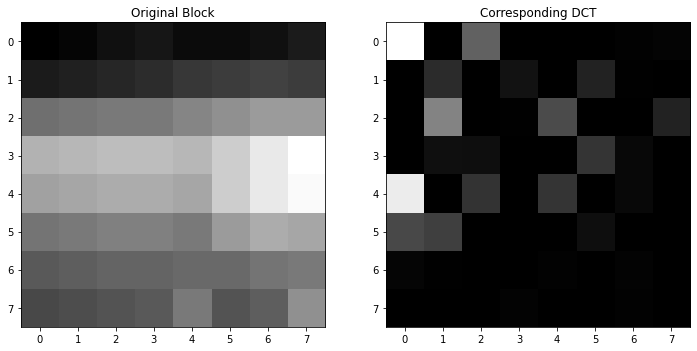

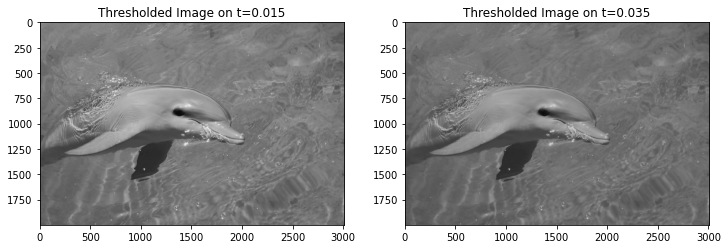

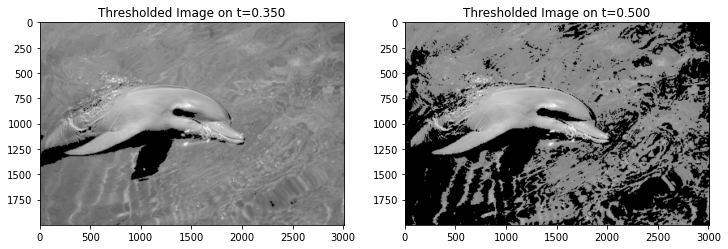

In [138]:
import scipy.fftpack as fft
from numpy import r_ as r

# Load image and transform it into its gray format, so it can satisfy the requirement
dolphin_img = cv2.imread('sample_imgs/dolphin.jpg')
dolphin_img = cv2.cvtColor(dolphin_img, cv2.COLOR_BGR2GRAY)

# Function: Perform specific block plot build 
def build_block_plot(img1, str1, img2, str2):
    
    # Plot and set titles, avoiding warning by using casting to np.uint8
    fig, ax = plt.subplots(1, 2, figsize=(12,12))
    ax[0].imshow(img1, cmap = 'gray')
    ax[0].set_title(str1)
    ax[1].imshow(img2, cmap = 'gray', vmax=np.max(img2)*0.01, vmin=0)
    ax[1].set_title(str2)
    hide_labels(ax)


# Function: Compute the 2D-DCT of a provided image, block-wise (8 by 8)
def compute_dct(img):
    
    new_img = img.copy()
    
    # Extract height and width from provided image, to ease use
    h = new_img.shape[0]
    w = new_img.shape[1]
    
    dct = np.zeros((h, w)) 
          
    # As per Lab6, perform the block-wise DCT
    for i in r[:h:8]:
        for j in r[:w:8]:
            dct[i:i+8, j:j+8] = fft.dct(fft.dct(new_img[i:i+8, j:j+8].T, norm='ortho').T, norm='ortho')
    
    return dct    

# Function: Compute the 2D-Inverse-DCT of a provided image, block-wise (8 by 8)
def compute_idct(dct_img, t_img):
    
    new_img = dct_img.copy()
    thr_img = t_img.copy()
    
    # Extract height and width from provided image, to ease use
    h = new_img.shape[0]
    w = new_img.shape[1]
    
    idct = np.zeros((h, w)) 
          
    # As per Lab6, perform the block-wise DCT
    for i in r[:h:8]:
        for j in r[:w:8]:
            idct[i:i+8, j:j+8] = fft.idct(fft.idct(thr_img[i:i+8, j:j+8].T, norm='ortho').T, norm='ortho')
    
    return idct  

# Function: Induces the threshold value into the provided DCT image - in function form so to ease experimentation
def threshold_img(img, t):
    
    new_img = img.copy()
    
    # Apply the threshold reduction
    th_img = np.multiply(new_img, (abs(new_img) > (t*np.max(new_img))))
    
    # Compute the percentage of coeff. kept
    p_kept = np.sum(th_img != 0.0) / (new_img.shape[0]*new_img.shape[1]*1.0)
    print(p_kept*100, "% of the coefficients were kept, i.e.", p_kept*new_img.shape[0]*new_img.shape[1]*1.0, "coefficients.") 
    
    # Inverse DCT-Transform the image
    final_img = compute_idct(new_img, th_img)
    
    return final_img   

# Compute 2D-DCT of the image
dolphin_dct = compute_dct(dolphin_img)

# Extract a single block to observe its coeff.
x_value, y_value = 1000, 1500 
block = dolphin_img[x_value:x_value+8, y_value:y_value+8]
block_dct = compute_dct(block)

# Display extractions to check DCT's effect
build_block_plot(block, "Original Block", block_dct, "Corresponding DCT")

# Determine K with the largest magnitudes, reducing loss, yet achieving compression
th_img1 = threshold_img(dolphin_dct, 0.015)
th_img2 = threshold_img(dolphin_dct, 0.035)
th_img3 = threshold_img(dolphin_dct, 0.350)
th_img4 = threshold_img(dolphin_dct, 0.500)

# Display thresholded images side by side, to ease comparisons
# This results in 0.015 serving to make the cut, since it becomes difficult to tell the difference (not even tone-wise! - which starts around 0.030)
# After this value, the compression begins to be noticed, as the image gets darker and darker, until actual distortions come up
build_plot(th_img1, "Thresholded Image on t=0.015", th_img2, "Thresholded Image on t=0.035", True)
build_plot(th_img3, "Thresholded Image on t=0.350", th_img4, "Thresholded Image on t=0.500", True)

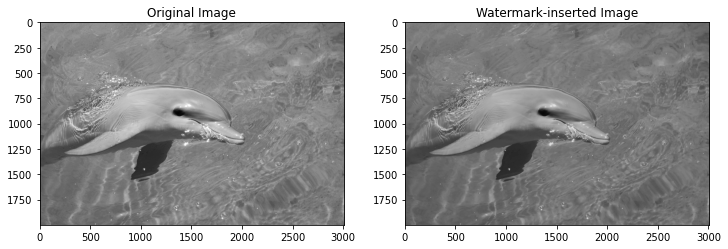

In [167]:
# Function: Create the (gaussian) watermark
def create_wm(img):
    
    new_img = img.copy()
    
    # Extract height and width from provided image, to ease use
    h = new_img.shape[0]
    w = new_img.shape[1]
    
    wm_img = np.zeros((h,w))
    
    # Approximation, based on the threshold empirical testing
    ns = np.random.normal(0, 1, 120)
    
    # Embed watermark on each block 
    for i in r[:h:8]:
        for j in r[:w:8]:
            
            h_b = new_img[i:i+8,j:j+8].shape[0]
            w_b = new_img[i:i+8,j:j+8].shape[1]
            
            # Create block to be watermarked
            wm_block = np.zeros((h_b,w_b))
            assist_b = np.abs(new_img[i:i+8,j:j+8])
            
            # Iterate all the noise data points and apply them to the image
            for ns_instance in ns:
                # Establish indices to insert watermark on by getting the largest values
                row, col = np.unravel_index(np.argmax(assist_b), (h_b, w_b))
                # Construct watermark equation
                multiplier = np.add(1, np.multiply(0.05, ns_instance)) 
                wm_block[row, col], assist_b[row, col] = np.multiply(new_img[i:i+8,j:j+8][row, col], multiplier), 0
            
            # Assign watermarked block to the current 8 by 8 section
            wm_img[i:i+8, j:j+8] = wm_block
    
    return wm_img

# Create watermark on the compressed image
wm_dolphin_img = create_wm(th_img1)

# Display images
build_plot(dolphin_img, "Original Image", wm_dolphin_img, "Watermark-inserted Image", True)

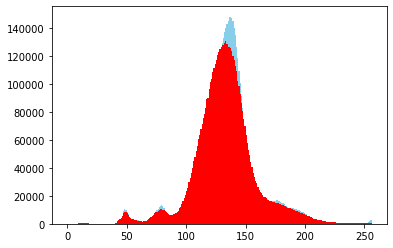

In [171]:
# Display both image's histograms in an overlapping manner, simulating the image difference computation
fig = plt.figure()
plt.hist(dolphin_img.flatten(),  256, [0,256], color = "skyblue")
plt.hist(wm_dolphin_img.flatten(), 256,  [0,256], color = "red")
plt.title("Histogram of Original (B) vs Watermarked (R) Images")
plt.show()

#### (2.2) Watermark Detection

### Task 3 - Morphology
#### (3.1) Orange Counting

ORANGE COUNT
The orange image portrays 24 oranges.
The orange tree image portrays 64 oranges.


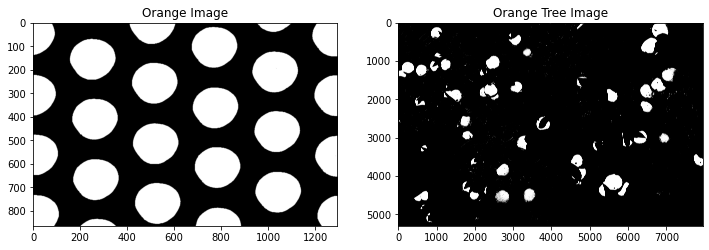

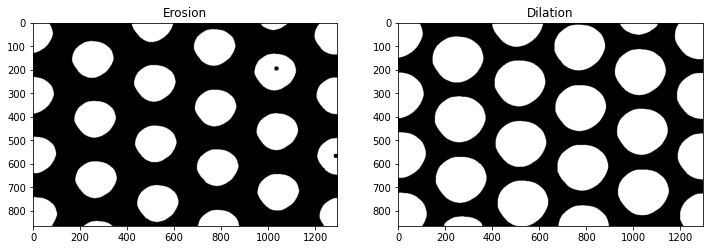

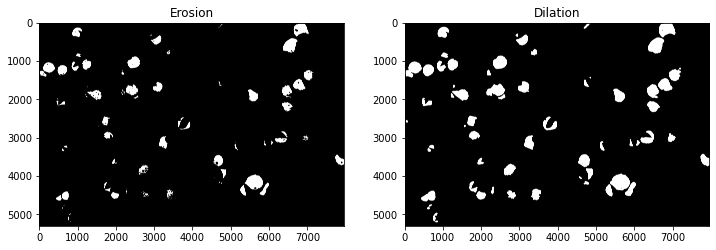

In [140]:
# Function: Isolate oranges in white, the rest blacks out
def convert_bw(img):
    
    new_img = img.copy()
    
    # The same threshold seemed to yield successful isolations in both images 
    # Thus, no need to pass it as a parameter
    th = 200 
    
    # 'Binarize' the image, turn all the values below the threshold to 255, the rest to 0
    res, new_img = cv2.threshold(new_img, th, 255, cv2.THRESH_BINARY)

    # Since orange is mostly present in the red channel,
    # assigning the 'binarized' R channel to G and B
    # resulted in a natural 3D-RGB black and white image
    new_img[:,:,1] = new_img[:,:,0]
    new_img[:,:,2] = new_img[:,:,0]
    
    return new_img

# Function: Transform an image to improve the counting process' effectiveness, using built-in morphological operations
def transform_img(img, display):
    
    new_img = img.copy()
    
    # Create the kernels (elliptical shape, to expand circularly) 
    kernel_e = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (18, 18))
    kernel_d = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (40, 40))
    
    # Erode and dilate image, mirroring the opening process - simulating noise removal
    img_e = cv2.erode(new_img, kernel_e)
    img_d = cv2.dilate(img_e, kernel_d)
    
    if display:
        build_plot(img_e, "Erosion", img_d, "Dilation", False)
    
    return img_d

# Function: Count the number of circular shaped objects in a given image
def count_oranges(img, is_tree):
    
    new_img = img.copy()
    
    # Improve image by opening it
    new_img = transform_img(new_img, True)
    
    # Recalled from project 1
    # Finds and groups the deliminations of each circular line, the length of which will be the approximate nr. of oranges
    # (this works only in grayscale, so converting first)
    gray_img = cv2.cvtColor(new_img, cv2.COLOR_BGR2GRAY)
    count, res = cv2.findContours(gray_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Attempt at detecting connected components manually - forced server to restart, so better left commented out
    #loop_count, seen = 0, np.zeros((len(gray_img[:,0]), len(gray_img[0,:])))
    #for i in range(0, len(gray_img[:,0])):
    #    for j in range(0, len(gray_img[0,:])):
    #        if gray_img[i,j] == 255 and seen[i,j] == 0:
    #            # Increase the count, if a new unseen 255-pixel component was detected
    #            loop_count += 1
    #            seen = check(gray_img, seen, i, j)
    #            seen[i,j] = 1
    #nr_oranges = loop_count
                                
    nr_oranges = len(count)
    
    # Display result
    if is_tree:
        print("The orange tree image portrays", nr_oranges, "oranges.")
    else: 
        print("The orange image portrays", nr_oranges, "oranges.")

# Function: Detect connected components manually, recursively
def check(gray_img, seen, i, j):
    # Traverse adjacent pixels with value 255 and mark if connected to previous ones
    # This would be done until no more adjacent 255-pixels existed and all pixels were seen
    if (i+1) < len(gray_img[:,0]) and (i-1) >= 0 and (j+1) < len(gray_img[0,:]) and (j-1) >= 0:
        if gray_img[i+1,j] == 255 and seen[i+1,j] == 0:
            seen = check(gray_img, seen, i+1, j)
            seen[i+1,j] = 1
        if gray_img[i-1,j] == 255 and seen[i-1,j] == 0:
            seen = check(gray_img, seen, i-1, j)
            seen[i-1,j] = 1
        if gray_img[i,j+1] == 255 and seen[i,j+1] == 0:
            seen = check(gray_img, seen, i, j+1)
            seen[i,j+1] = 1
        if gray_img[i,j-1] == 255 and seen[i,j-1] == 0:
            seen = check(gray_img, seen, i, j-1)
            seen[i,j-1] = 1
            
    return seen
    
    
# Load images and transform them (to RGB, so to keep 3 dimensions as requested)
orange_img1 = cv2.imread('sample_oranges/oranges.jpg')
orange_img1 = cv2.cvtColor(orange_img1, cv2.COLOR_BGR2RGB)

orange_img2 = cv2.imread('sample_oranges/orangetree.jpg')
orange_img2 = cv2.cvtColor(orange_img2, cv2.COLOR_BGR2RGB)

# Manually convert them into black and white images
bw_orange_img1 = convert_bw(orange_img1)
bw_orange_img2 = convert_bw(orange_img2)

# Display images
build_plot(bw_orange_img1, "Orange Image", bw_orange_img2, "Orange Tree Image", False)

# Count and display each image's amount of oranges
print("ORANGE COUNT")
count_oranges(bw_orange_img1, False)
count_oranges(bw_orange_img2, True)

Naturally, the algorithm depends on detecting **color-based limits**, so one same orange intercepted by a leaf will count as two. Similarly, two oranges closely placed together may count as one, at times. Moreover, clear leaves due to natural or artificial lighting may have not been filtered out during the threshold binary stage, which could mean an addition of an unwanted orange to the image count.

Apart from that, following the process commented throughout the code snippet, we can see it was able to figure out where to morphologically count an orange (circle). The **opening** was able to filter out some of the unwanted noise, yet not all, as the **threshold** and the **kernel dimensions** can combine in many different ways to obtain different results.

**NOTE:** The counting process was done through findContours() as a way to display an actual number somehow. However, the manual looping algorithm potentially could achieve the same values, was it not to cause the kernel to restart every time, due to memory overloading. In any case, as to show the non-use of in-built functions, either skimage, opencv, skicit, etc., I decided to leave it in the snippet, commented out.

#### (3.2) Granulometry

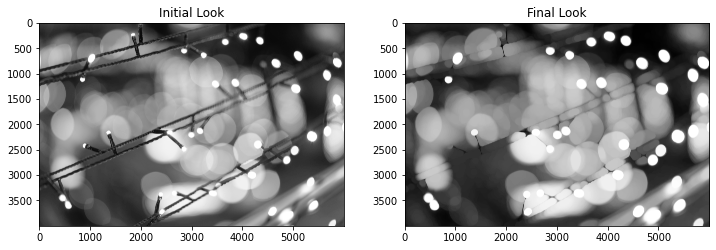

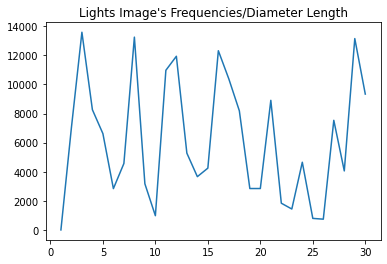

In [141]:
# Function: Compute frequency of image lights
def find_freq(img, nr_freq): 
    
    new_img = img.copy()
    
    int_freq = np.linspace(1, nr_freq, nr_freq)
    crt_sum = sum(sum(new_img))
    
    for i in range(1, nr_freq):
        
        # Transform under an opening operation so to mitigate grayscale's influence and remove non-relevant lighting
        kernel_e = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (2*i, 2*i))
        kernel_d = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (4*i, 4*i))

        img_e = cv2.erode(new_img, kernel_e)
        img_d = cv2.dilate(img_e, kernel_d)
        
        # The transformation outcomes should are added to the intensity array
        int_freq[i] = abs(np.subtract(crt_sum, sum(sum(img_d))))
        # Update crt_sum's value as to compute the difference between consecutive elements the next iteration
        crt_sum = sum(sum(img_d))
    
    # Display final transformed image
    build_plot(new_img, "Initial Look", img_d, "Final Look", True)
    
    return int_freq

# Load image and transform them (to grayscale, as requested)
light_img1 = cv2.imread('sample_imgs/lights.jpg')
light_img1 = cv2.cvtColor(light_img1, cv2.COLOR_BGR2GRAY)

# Find the 'nr_freq' lights' frequencies of the one (the first) image, as suggested
nr_freq = 30
lights_img1_freq = find_freq(light_img1, nr_freq)

# Plot frequencies
fig = plt.figure()
plt.plot(np.linspace(1, nr_freq, nr_freq), lights_img1_freq)
plt.title("Lights Image's Frequencies/Diameter Length")
plt.show()

Since the **dilation** effect is being more **significantly increased**, when compared to the precedent erosion (4*i vs 2*i), the result is an image with a contrast that has larger diameters. This is done consecutively and therefore, when computing the frequency difference between each iteration's image transformations, the sharp distance between lights' frequencies every 3/4 iterations becomes apparent, as seen in the plot.

### Task 4 - PCA Recognition (on equally sized images)
(Choose 3 images and create N variations (atl. 5) for each)

Variation examples: noise addition, illumination/contrast varying, third-party face section alterations...

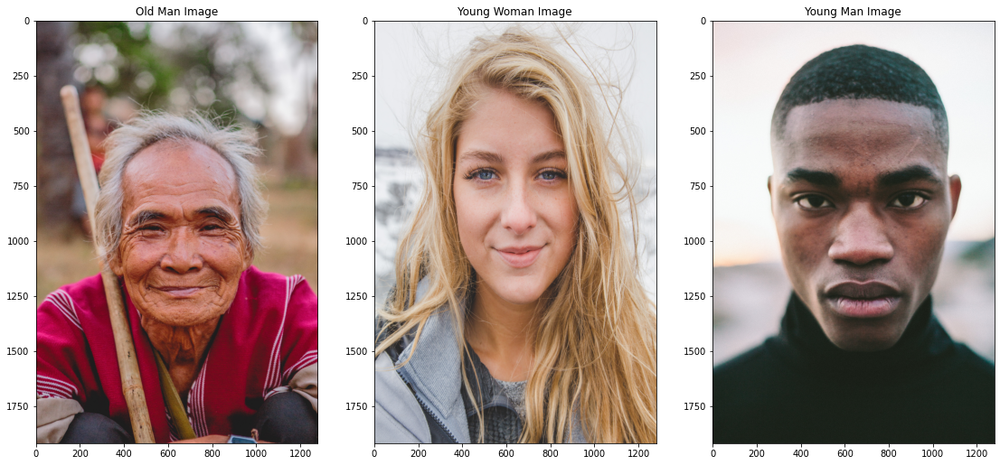

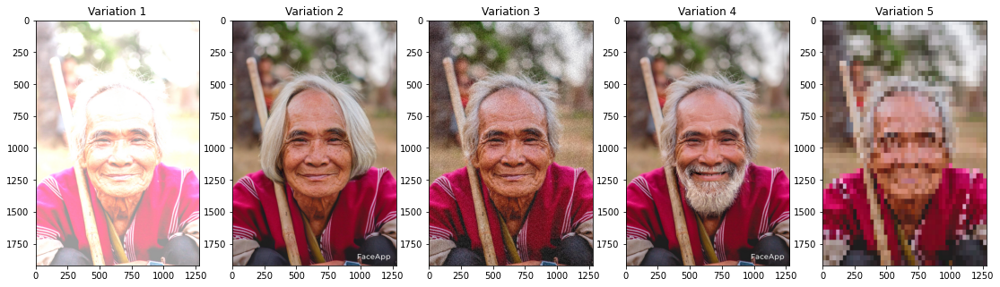

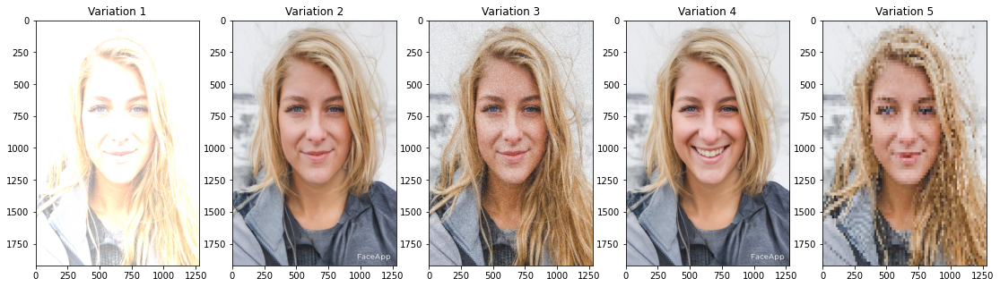

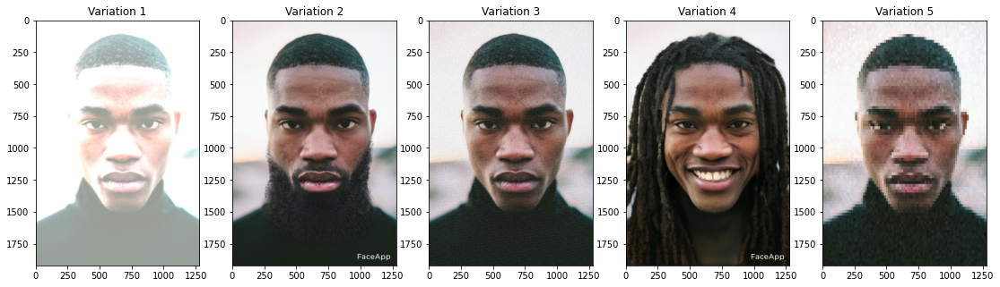

In [142]:
import glob

# Function: Build varying size side-by-side image plots, to ease display
def build_var_plot(img_list, label_list):
    
    nr_instances = len(img_list)
    
    fig, ax = plt.subplots(1, nr_instances, figsize=(19,10))
    
    for i in range(nr_instances):
        ax[i].imshow(img_list[i])
        ax[i].set_title(label_list[i])
        hide_labels(ax)

# Function: Load img_nr's variations already present in local folders - using glob, such that reading several images in one line is doable  
def get_variations(img_nr):
    
    # Empty array to be filled
    img_var = []
    
    # Load and transform each variation accordingly
    if img_nr == 1:
        for i in glob.glob("personal_imgs/face_1*.jpeg"):
            img_var.append(cv2.imread(i))
    elif img_nr == 2:
        for i in glob.glob("personal_imgs/face_2*.jpeg"):
            img_var.append(cv2.imread(i))
    elif img_nr == 3:
        for i in glob.glob("personal_imgs/face_3*.jpeg"):
            img_var.append(cv2.imread(i))
    
    # Transform images
    for index in range(5):
        img_var[index] = cv2.cvtColor(img_var[index], cv2.COLOR_BGR2RGB) 
                
    return img_var

# Load and transform the 3 required face images
face_img1 = cv2.imread('sample_imgs/old2.jpg')
face_img2 = cv2.imread('sample_imgs/woman1.jpg')
face_img3 = cv2.imread('sample_imgs/man2.jpg')

face_img1 = cv2.cvtColor(face_img1, cv2.COLOR_BGR2RGB)
face_img2 = cv2.cvtColor(face_img2, cv2.COLOR_BGR2RGB)
face_img3 = cv2.cvtColor(face_img3, cv2.COLOR_BGR2RGB)

# Resize images so their dimensions match - to facilitate their manipulation
# Inverted 1920x1280, since they're vertical images
match_dimensions = (1280, 1920) 
face1 = cv2.resize(face_img1, match_dimensions)
face2 = cv2.resize(face_img2, match_dimensions)
face3 = cv2.resize(face_img3, match_dimensions)

# Display original images
build_var_plot([face1, face2, face3], ["Old Man Image", "Young Woman Image", "Young Man Image"])

# Upload the 5 created variations for each image
var_face1 = get_variations(1)
var_face2 = get_variations(2)
var_face3 = get_variations(3)

# Display variations
# For reference, the variations are, respectively and equal for every image:
# High brighness / Beard/hairstyle change / Additive noise / Added smile / Pixelation
# NOTE: Unfortunately, the watermark from FaceApp couldn't be removed without subscribing, so it had to be uplodaded this way
variation_labels = ["Variation 1", "Variation 2", "Variation 3", "Variation 4", "Variation 5"]
build_var_plot(var_face1, variation_labels)
build_var_plot(var_face2, variation_labels)
build_var_plot(var_face3, variation_labels)

##### 1. Eigenface Finding using N variations (SbS Explanation)

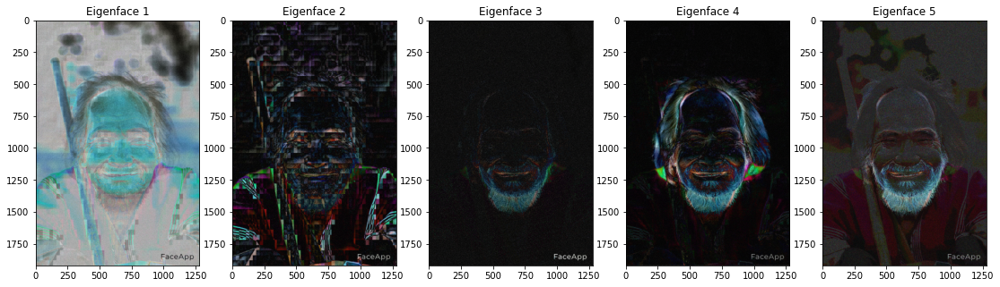

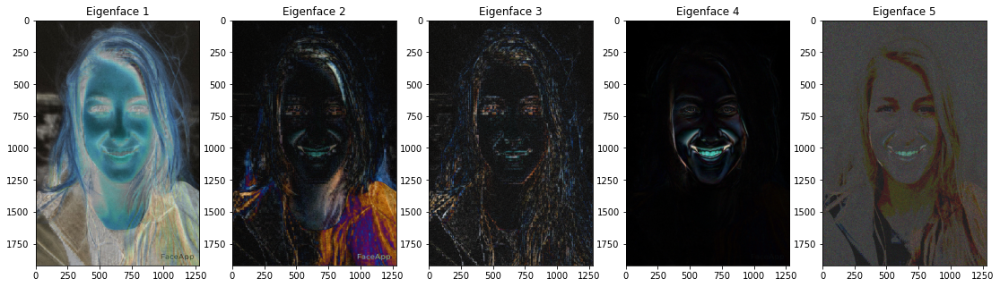

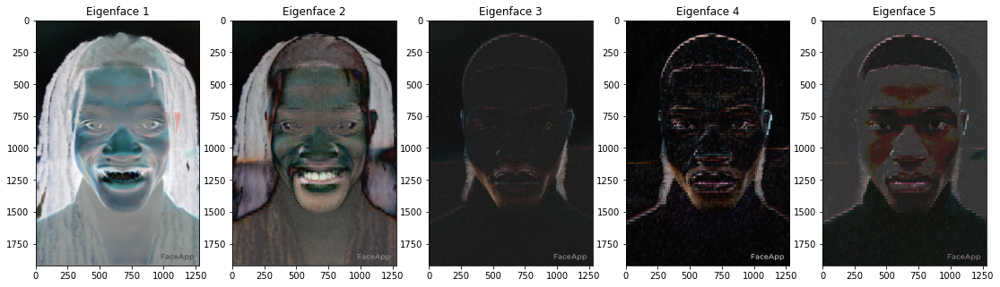

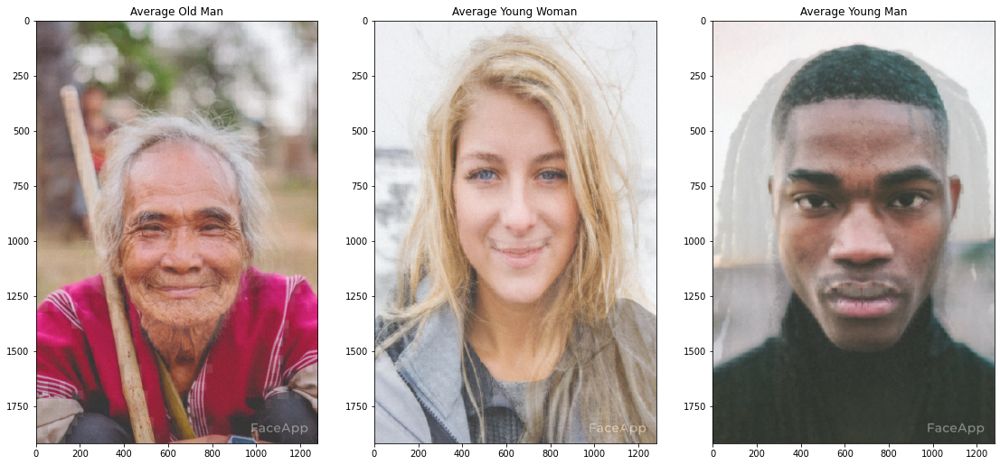

In [143]:
# Function: Find a given face's eigenfaces using the 5 variations as samples
def find_eigenfaces(var_face):
    
    new_var_face = var_face.copy()
    
    # Empty array to be filled
    eigenfaces = []
        
    # Finish the PCA process by computing eigenvectors and values
    eigenvectors, mean = compute_pca(new_var_face)
    
    # Compute eigenfaces - a reshape is done so the vectors can be represented as images
    for i in eigenvectors:
        eigenfaces.append(np.reshape(i, (new_var_face[0].shape)))
     
    # Normalize and adjust eigenfaces' format, so that no warnings are shown
    for i in range(len(eigenfaces)):
        eigenfaces[i] = ((np.divide(np.abs(eigenfaces[i]), np.max(eigenfaces[i])))* 255).astype(np.uint8)
     
    # Same process individually with the average face
    meanface = np.reshape(mean, new_var_face[0].shape)
    meanface = ((np.divide(np.abs(meanface), np.max(meanface)))* 255).astype(np.uint8)
    
    return eigenvectors, eigenfaces, meanface

# Function: Compute PCA steps as described on OpenCV's article mediator
def compute_pca(var_face):
    
    new_var_face = var_face.copy()
    
    # First, assemble all points into a data matrix, unfolding images k^2-dimensionally
    data_m = []
    for i in range(len(new_var_face)):
        data_m.append(new_var_face[i].flatten())
        
    # Convert data_m into np.array, so it is accepted by PCACompute()
    data_m = np.asarray(data_m)
        
    # Secondly, compute the mean and eigenvectors, using OpenCV's in-built function
    # NOTE: this function allows this method to skip some steps, which are being done by the function itself
    # Calculating the difference and the eigenvectors and values from the covariance matrix would result in the eigenvectors obtained
    mean, eigenvectors = cv2.PCACompute(data_m, mean = np.array([]))
    
    return eigenvectors, mean
    
# Get each face's eigenfaces
ev_face1, ef_face1, mean_face1 = find_eigenfaces(var_face1)
ev_face2, ef_face2, mean_face2 = find_eigenfaces(var_face2)
ev_face3, ef_face3, mean_face3 = find_eigenfaces(var_face3)

# Display obtained eigenfaces
ef_labels = ["Eigenface 1", "Eigenface 2", "Eigenface 3", "Eigenface 4", "Eigenface 5"]
build_var_plot(ef_face1, ef_labels)
build_var_plot(ef_face2, ef_labels)
build_var_plot(ef_face3, ef_labels)

# Display the 3 average faces
build_var_plot([mean_face1, mean_face2, mean_face3], ["Average Old Man", "Average Young Woman", "Average Young Man"])

Each image's eigenfaces is shown above, as well as their average faces.

**Eigenfaces** tell us the variance of the provided image matrices. In this example, we can see that the difference between the mean face and every other variation of one same image is clearly represented. This is because aspects from each image span throughout each eigenface. Every eigenface highlights certain features, in a way the mentioned variance helps to pinnacle.

Starting with the **average** ones, it's clear to see that the similarities with the original image are very noticeable, since 3 of the 5 variations don't vary in shape at all. In any case, we can quite easily detect aspects of the two biggest changes done to each image, regardless of what they are. In particular, the young man's black hair is very easy to distinguish from the white background.

##### 2. Face Reconstruction using All Eigenfaces and 2 (approx.) Eigenfaces

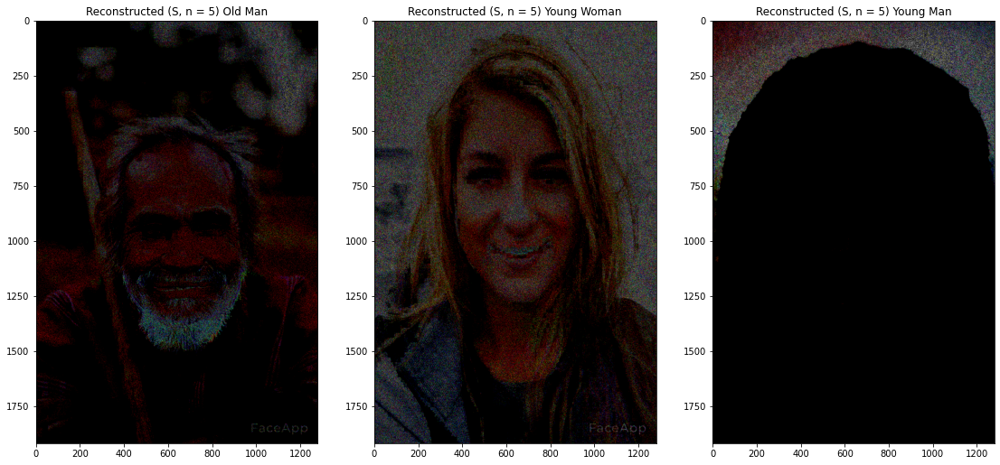

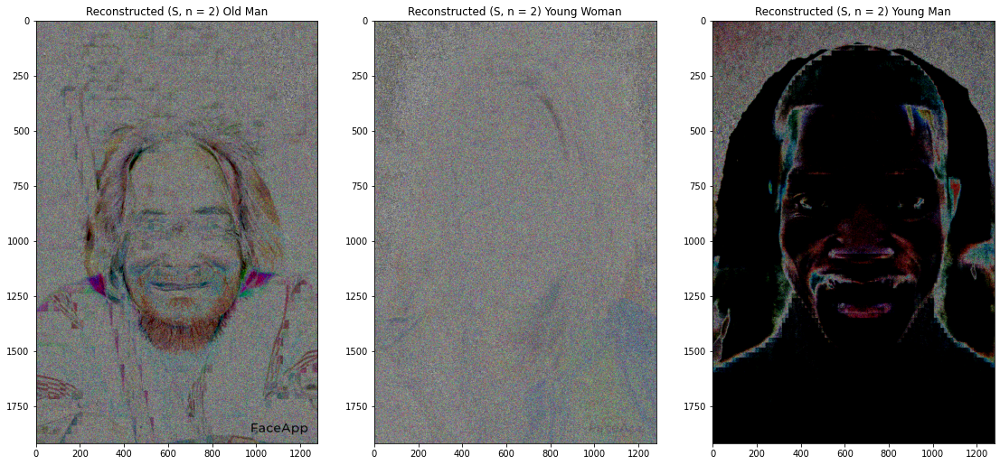

In [144]:
# Function: Reconstruct an image based on the provided parameters
def reconstruct(var_face, same_ev, same_ef, mean, nr_ef):
    
    vf = var_face.copy()
    ev = same_ev.copy()
    ef = same_ef.copy()
    mf = mean.copy()
    
    reconstructed_face = mf
    
    if(nr_ef == 5):
        # Gradually build upon the reconstructed face
        for i in range(0, nr_ef):

            # Create the image vector to be used in the dot product computation, i.e. the difference between each face and the mean
            iv = np.subtract(vf[i].flatten(), mf.flatten())

            # Compute the weight, i.e. the dot product of the one image's vector and the eigenvector itself
            w = np.dot(iv, ev[i])

            # Add result of each iteration to the reconstructed face
            reconstructed_face = np.add(reconstructed_face, np.multiply(ef[i], w))
    else: 
        # Same process, yet on specific indices
        usable_indices = [1, 3]
        for i in usable_indices:
            iv = np.subtract(vf[i].flatten(), mf.flatten())
            w = np.dot(iv, ev[i])
            reconstructed_face = np.add(reconstructed_face, np.multiply(ef[i], w))
    
    return (np.abs(reconstructed_face)*255).astype(np.uint8)

# Reconstruct each face through all their own eigenfaces
recs_face1 = reconstruct(var_face1, ev_face1, ef_face1, mean_face1, 5)
recs_face2 = reconstruct(var_face2, ev_face2, ef_face2, mean_face2, 5)
recs_face3 = reconstruct(var_face3, ev_face3, ef_face3, mean_face3, 5)

# Reconstruct each face through 2 of their own eigenfaces
recs_face1_2 = reconstruct(var_face1, ev_face1, ef_face1, mean_face1, 2)
recs_face2_2 = reconstruct(var_face2, ev_face2, ef_face2, mean_face2, 2)
recs_face3_2 = reconstruct(var_face3, ev_face3, ef_face3, mean_face3, 2)

# Display results (S -> Same AND n = nr_ef)
# For all:
build_var_plot([recs_face1, recs_face2, recs_face3], 
               ["Reconstructed (S, n = 5) Old Man", "Reconstructed (S, n = 5) Young Woman", "Reconstructed (S, n = 5) Young Man"])
# For some:
build_var_plot([recs_face1_2, recs_face2_2, recs_face3_2], 
               ["Reconstructed (S, n = 2) Old Man", "Reconstructed (S, n = 2) Young Woman", "Reconstructed (S, n = 2) Young Man"])

As we can see, the resulting **reconstructions** vary in effectiveness. They heavily depend on the feeded eigenfaces, and since so little samples were provided, the reconstruction highly tends towards which characteristics are featured by each eigenface.

Ignoring the image tones, the case where **all the eigenfaces** were used gives a somewhat similar result with the young woman, when compared with the corresponding unvaried image. The old man has its beard highlighted, but apart from that, it does resemble the original picture. Finally, the young man got overshadowed by the added hair feature.

The **smaller eigenface** sample use resulted in very biased result. On the young man (as well as less intensely on the old man), since the second and fourth eigenfaces result in a good balance between features, it becomes an overall more visible reconstructed image. The same cannot be said about the young woman, that got quite hidden behind the noise variation.

##### 3. Face Reconstruction using a Different Face's Weights

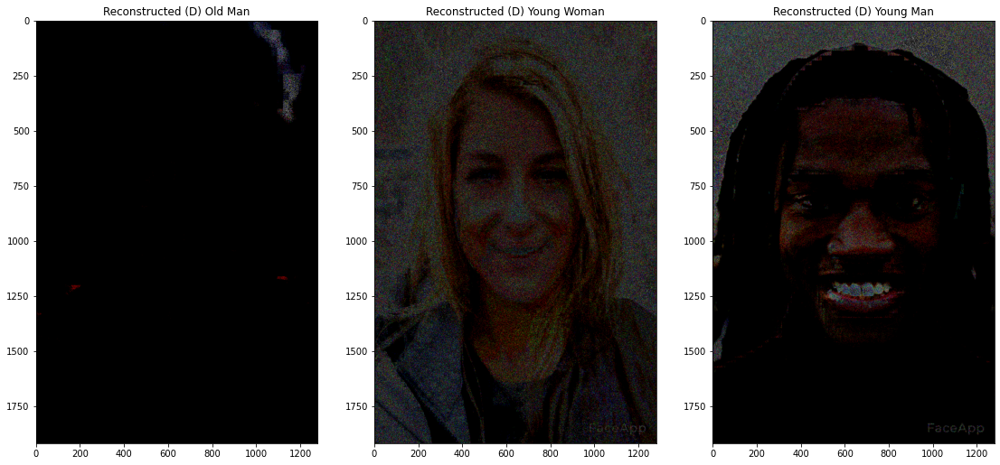

In [145]:
# Reconstruct each face through each other's weights, i.e. compute weights with different eigenvector
recd_face1 = reconstruct(var_face3, ev_face3, ef_face1, mean_face3, 5)
recd_face2 = reconstruct(var_face1, ev_face1, ef_face2, mean_face1, 5)
recd_face3 = reconstruct(var_face2, ev_face2, ef_face3, mean_face2, 5)

# Display results (D -> Different)
build_var_plot([recd_face1, recd_face2, recd_face3], ["Reconstructed (D) Old Man", "Reconstructed (D) Young Woman", "Reconstructed (D) Young Man"])

In this computation, any instance that could affect the weights value was provided via a different face's results. The remaining ones were still based on the image in question, willing to be reconstructed.

The result is shown above, and it allows us to see that **different PCA values** affect images differently, once again, due to the small sample size. It does curiously improve the young man's image accuracy, when compared with the previous reconstructions. 

Given this observation, it is possible to conclude that the average face's influence is not heavily significant and that weights don't necessarily have to be built upon one same image's computations to achieve better results. This also means finding an algorithm that learns from the weights provided, constantly comparing the reconstruction with the original image, could prove to be effective.